In [ ]:
import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import colorsys
warnings.filterwarnings("ignore")
plt.rcParams['font.family'] = 'Arial'
# For LaTeX rendering
plt.rcParams['text.usetex'] = False
# default font size
plt.rcParams['font.size'] = 13



def to_palette(color, n_colors):
    """
    Generate a palette of `n_colors` shades based on a given input color.
    
    Parameters:
        color (str or tuple): Base color in any matplotlib-compatible format (e.g., "#RRGGBB", "red", or (r, g, b)).
        n_colors (int): Number of shades to generate.
    
    Returns:
        list of str: A list of hex color codes representing shades of the input color.
    """
    # Convert to RGB in range [0, 1]
    rgb = mcolors.to_rgb(color)
    
    # Convert RGB to HLS
    h, l, s = colorsys.rgb_to_hls(*rgb)
    
    # Spread lightness around the original color
    delta = 0.3  # Max shift in lightness
    start = max(0, l - delta)
    end = min(1, l + delta)
    
    # Generate shades
    lightness_vals = [start + i * (end - start) / (n_colors - 1) for i in range(n_colors)]
    palette = [
        mcolors.to_hex(colorsys.hls_to_rgb(h, l_val, s))
        for l_val in lightness_vals
    ]
    
    return palette[::-1]
    

def to_colormap(base_color, dark=0.2, light=0.9, name="custom_colormap"):
    """
    Create a continuous colormap based on a single base color.
    
    Parameters:
        base_color (str or tuple): Base color (e.g., 'blue', '#3366cc', (0.2, 0.4, 0.8)).
        dark (float): Minimum lightness (0–1).
        light (float): Maximum lightness (0–1).
        name (str): Name for the colormap.

    Returns:
        matplotlib.colors.LinearSegmentedColormap: A continuous colormap.
    """
    # Convert to RGB and then to HLS
    rgb = mcolors.to_rgb(base_color)
    h, l, s = colorsys.rgb_to_hls(*rgb)
    
    # Define color range in HLS space, then convert back to RGB
    colors = [
        colorsys.hls_to_rgb(h, light, s),
        colorsys.hls_to_rgb(h, l, s),
        colorsys.hls_to_rgb(h, dark, s)
    ]
    rgb_colors = [mcolors.to_rgb(c) for c in colors]

    # Create a LinearSegmentedColormap
    cmap = LinearSegmentedColormap.from_list(name, rgb_colors)  # dark -> base -> light
    return cmap

def mad(x, axis=0):
    return np.median(np.abs(x - np.median(x, axis=axis)), axis=axis) / 0.6745


In [35]:
training_df = pd.read_csv("/home/malbrank/Documents/ProteomeLM/img/training_log.csv")


screening_df_goldstandard = pd.read_csv("/data2/malbrank/proteomelm/goldstandard/checkpoint_screening.csv").set_index("model_name")
baselines_goldstandard = {
    #"Random": {"AUC": 0.5, "AUPR": 0.5},
    "PIPR": {"AUC": 0.54, "AUPR": 0.53},
    "D-SCRIPT": {"AUC": 0.56, "AUPR": 0.58},
    "Topsy Turvy": {"AUC": 0.6, "AUPR": 0.62},
    "TuNA": {"AUC": 0.7, "AUPR": 0.69}, 
    #"ESM-C": {"AUC": 0.73, "AUPR": 0.723},
    }
species_names = ["ecoli", "yeast", "human", "fly", "worm", "mouse"]
clean_species_names = ["E. coli", "S. cerevisiae", "H. sapiens",  "D. melanogaster", "C. elegans", "M. musculus"]

screening_df_dscript = pd.read_csv("/data2/malbrank/proteomelm/dscript/checkpoint_screening.csv").set_index("model_name")
screening_df_dscript_dict = {}
for spec in species_names:
    screening_df_dscript_dict[spec] = pd.read_csv(f"/data2/malbrank/proteomelm/dscript/{spec}/checkpoint_screening.csv").set_index(["model_name", "checkpoint"])
    # drop duplicated index
    screening_df_dscript_dict[spec] = screening_df_dscript_dict[spec][~screening_df_dscript_dict[spec].index.duplicated(keep='first')]
baselines_dscript = {"mouse": {
                        "PIPR": {"AUC": 0.839, "AUPR": 0.526},
                       "D-SCRIPT": {"AUC": 0.901, "AUPR": 0.663},
                          "Topsy Turvy": {"AUC": 0.934, "AUPR": 0.735},
                            "TUnA": {"AUC": 0.978, "AUPR": 0.885}},
            "fly": {
                    "PIPR": {"AUC": 0.728, "AUPR": 0.278},
                    "D-SCRIPT": {"AUC": 0.89, "AUPR": 0.605},
                    "Topsy Turvy": {"AUC": 0.921, "AUPR": 0.713},
                    "TUnA": {"AUC": 0.971, "AUPR": 0.855}},
            "worm": {
                     "PIPR": {"AUC": 0.757, "AUPR": 0.346},
                     "D-SCRIPT": {"AUC": 0.853, "AUPR": 0.55},
                     "Topsy Turvy": {"AUC": 0.906, "AUPR": 0.7},
                     "TUnA": {"AUC": 0.96, "AUPR": 0.834}},
            "yeast": {
                      "PIPR": {"AUC": 0.718, "AUPR": 0.23},
                      "D-SCRIPT": {"AUC": 0.79, "AUPR": 0.399},
                      "Topsy Turvy": {"AUC": 0.85, "AUPR": 0.534},
                      "TUnA": {"AUC": 0.898, "AUPR": 0.641}},
            "ecoli": {
                        "PIPR": {"AUC": 0.675, "AUPR": 0.271},
                        "D-SCRIPT": {"AUC": 0.77, "AUPR": 0.513},
                        "Topsy Turvy": {"AUC": 0.805, "AUPR": 0.556},
                        "TUnA": {"AUC": 0.883, "AUPR": 0.677}}}

unique_metrics = set(["_".join(x.split("_")[:2]) for x in screening_df_dscript.columns if x.startswith("AUC") or x.startswith("AUPR")])

for metric in unique_metrics:
    screening_df_dscript[f"{metric}_Median"] = np.median([screening_df_dscript[f"{metric}_{i}"] for i in range(5)], axis=0)
    screening_df_dscript[f"{metric}_Mean"] = np.mean([screening_df_dscript[f"{metric}_{i}"] for i in range(5)], axis=0)
    screening_df_dscript[f"{metric}_Std"] = np.std([screening_df_dscript[f"{metric}_{i}"] for i in range(5)], axis=0)
    screening_df_dscript[f"{metric}_Mad"] = mad([screening_df_dscript[f"{metric}_{i}"] for i in range(5)], axis=0)

model_names = [ "ProteomeLM-Mini-MSE", "ProteomeLM-Mini-Cosine", "ProteomeLM-Mini", "ProteomeLM-Mini-Eukaryotes-Pretrain", "ProteomeLM-Mini-Eukaryotes-Scratch",]
clean_model_names = ["ProteomeLM - MSE Loss", "ProteomeLM - Cosine Loss", "ProteomeLM - Polar Loss", "ProteomeLM Eukaryotes - Pretrain", "ProteomeLM Eukaryotes - Scratch", "ProteomeLM - Long Context"]

size_names = ["ProteomeLM-XXS", "ProteomeLM-Mini", "ProteomeLM-S", "ProteomeLM-M"]
clean_size_names = ["ProteomeLM-XS", "ProteomeLM-S", "ProteomeLM-M", "ProteomeLM-L"]
clean_size_names_short = ["XS", "S", "M", "L"]
parameters_size = [5.7e6, 36e6, 112e6, 328e6]
model_architectures = {"ProteomeLM-XXS": (6, 8), 
                       "ProteomeLM-Mini": (6, 8), 
                       "ProteomeLM-S": (12, 12), 
                       "ProteomeLM-M": (16, 16), 
                       "ProteomeLM-Mini-MSE": (6, 8), 
                       "ProteomeLM-Mini-Cosine": (6, 8), 
                       "ProteomeLM-Mini-Eukaryotes-Pretrain": (6, 8), 
                       "ProteomeLM-Mini-Eukaryotes-Scratch": (6, 8)}
colors_pals_baselines = (0.5, 0.5, 0.5)
colors_pals_goldstandard =  colorspal12[0]
colors_pals = {"ecoli": colorspal6[0],
                "yeast": colorspal6[5],
                "human": colorspal6[2],
                "fly": colorspal6[3],
                "worm": colorspal6[4],
                "mouse": colorspal6[1],
                #"ProteomeLM-XXS": colorspal12[7],
                #"ProteomeLM-Mini": colorspal12[8],
                #"ProteomeLM-S": colorspal12[9],
                #"ProteomeLM-M": colorspal12[11],
                }

ppi_models = [ "ProteomeLM+Att"]
patterns = ['/', '\\', 'o', 'x', '-', '|', '\\']

## Figure 1

KeyboardInterrupt: 

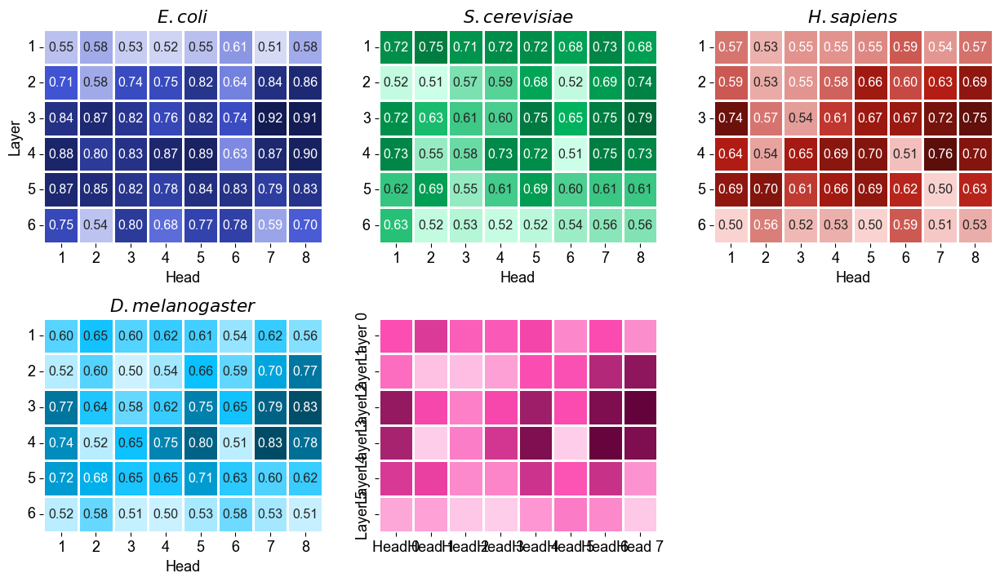

In [14]:
metric = "AUC"
model = "ProteomeLM-Mini"
plt.figure(figsize=(15, 8))
for k, (spec, clean_spec) in enumerate(zip(species_names[:6], clean_species_names[:6])):
    plt.subplot(2, 3, k+1)
    plt.subplots_adjust(hspace=0.35)
    screening_df = screening_df_dscript_dict[spec]
    cmap = to_colormap(colors_pals[spec])

    row = screening_df.loc[model, 210]
    n_layers, n_heads = model_architectures[model]
    matrix = np.zeros((n_layers, n_heads))
    for i in range(n_layers):
        for j in range(n_heads):
            matrix[i][j] = row[f"{metric}, Layer {i}, Head {j}"]
    if metric == "AUC":
        matrix = np.abs(matrix - 0.5) + 0.5

    head_labels = [f"Head {i}" for i in range(n_heads)]
    layer_labels = [f"Layer {i}" for i in range(n_layers)]
    sns.heatmap(
        matrix,
        cmap=cmap,    # Darker, more modern colormap
        annot=True,
        fmt=".2f",
        xticklabels=head_labels,  # Set x-axis labels as heads
        yticklabels=layer_labels, # Set y-axis labels as layers
        linewidths=1.0,           # Increased linewidths for more spacing between cells
        #vmin=vmin,
        #vmax=vmax,
        cbar=False,
        annot_kws={"size": 11.5},
    )
    plt.title(f"$\\mathbf{{\\it{{{clean_spec}}}}}$", fontweight='bold')
    plt.xlabel("Head")
    if k==0:
        plt.ylabel("Layer")
    plt.xticks(np.arange(n_heads)+0.5, [f"{i+1}" for i in range(n_heads)], rotation=0)
    plt.yticks(np.arange(n_layers)+0.5, [f"{i+1}" for i in range(n_layers)], rotation=0)
    cbar = plt.gca().collections[0].colorbar
plt.savefig(f"/home/malbrank/Documents/ProteomeLM/img/per_head_auc_unsupervised_proteomelmS.svg", bbox_inches='tight', dpi=300)
plt.show()


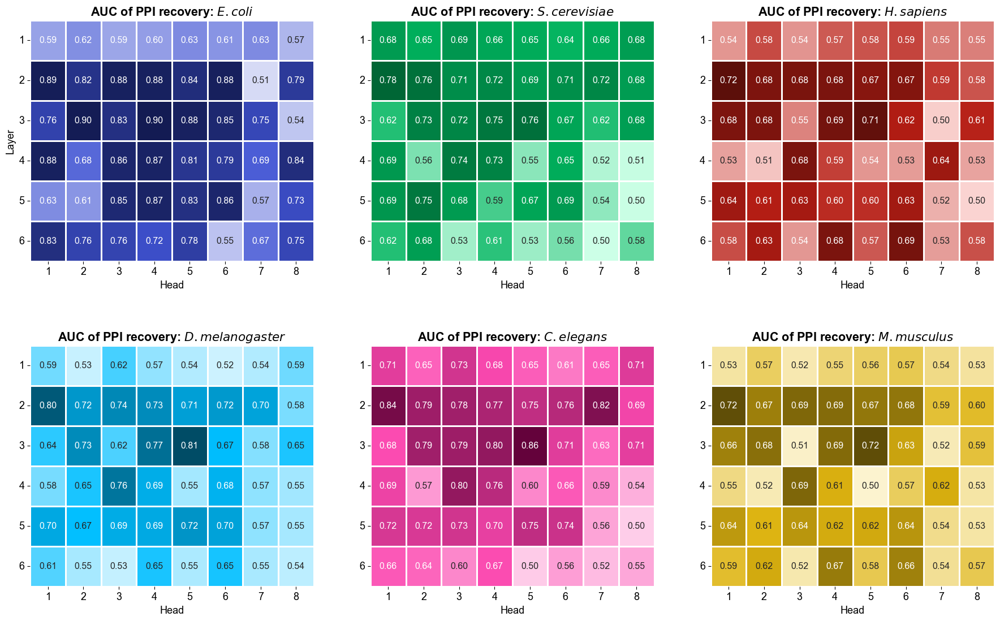

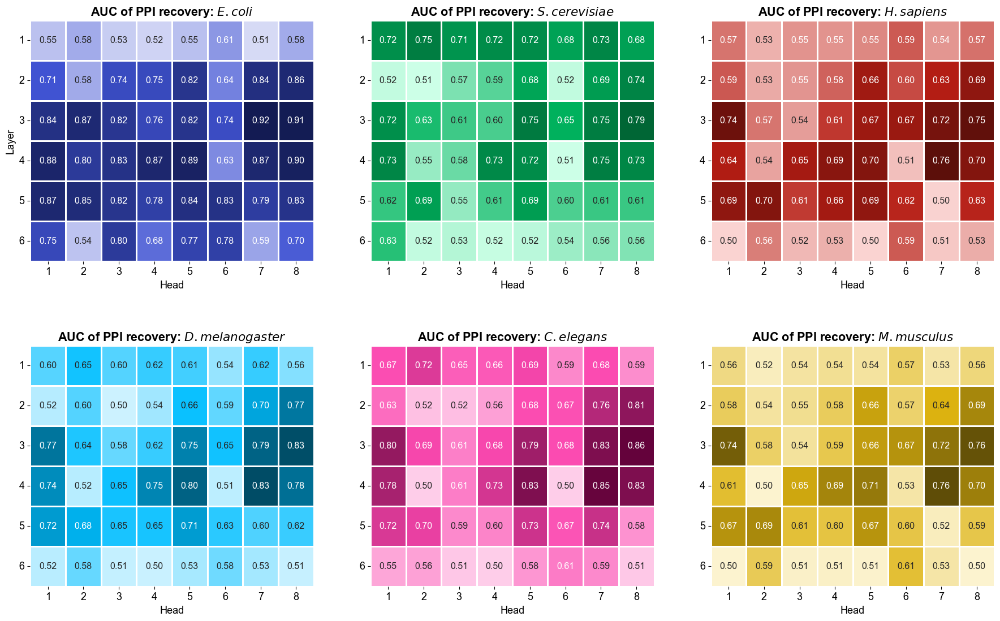

Skipping mouse for ProteomeLM-S due to missing data.


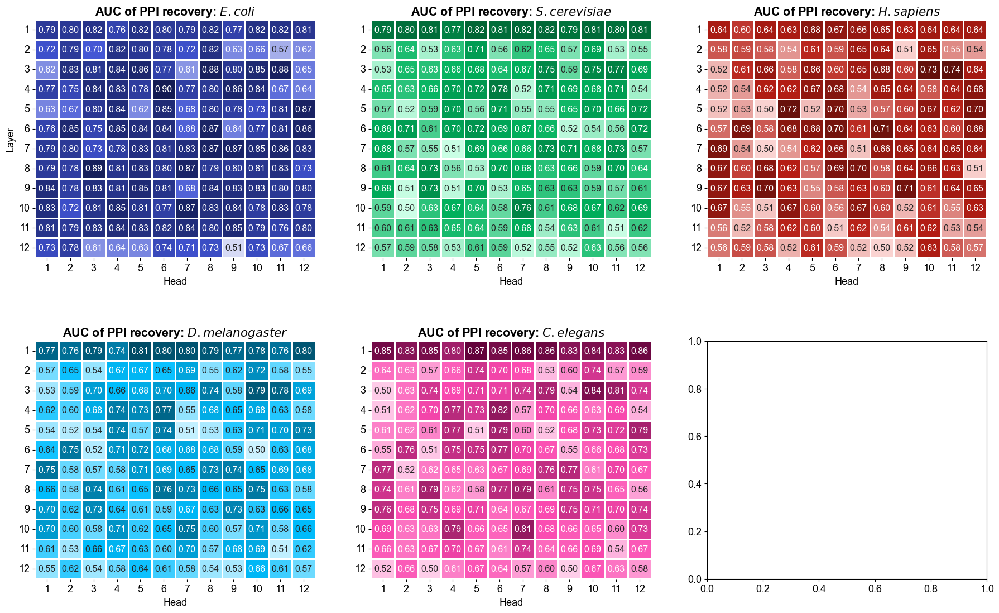

Skipping ecoli for ProteomeLM-M due to missing data.
Skipping yeast for ProteomeLM-M due to missing data.
Skipping human for ProteomeLM-M due to missing data.
Skipping fly for ProteomeLM-M due to missing data.
Skipping worm for ProteomeLM-M due to missing data.
Skipping mouse for ProteomeLM-M due to missing data.


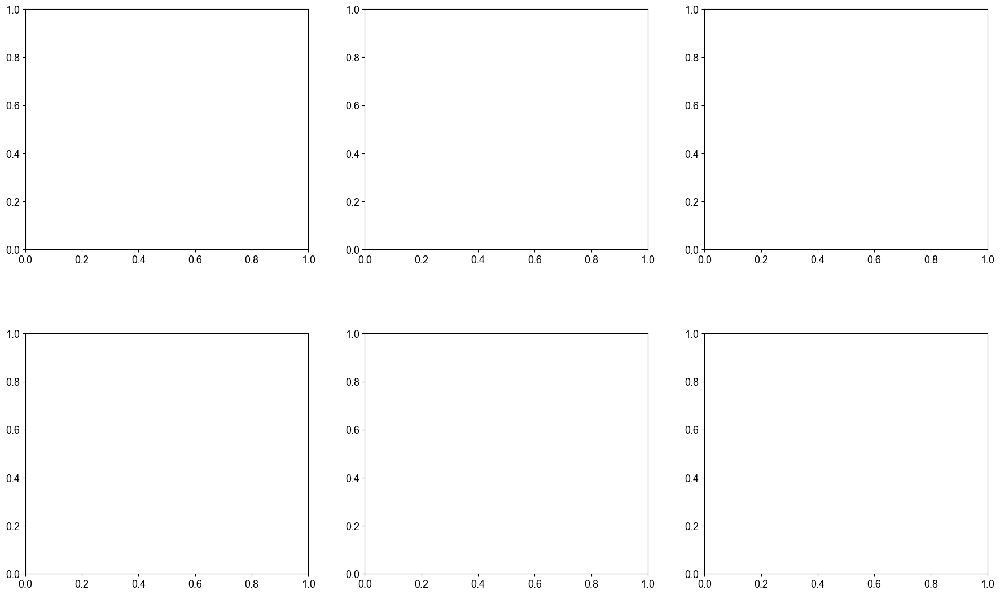

In [43]:
metric = "AUC"
model = "ProteomeLM-S"
for model in size_names:
    n_layers, n_heads = model_architectures[model]
    plt.figure(figsize=(22, 13))
    for k, (spec, clean_spec) in enumerate(zip(species_names[:6], clean_species_names[:6])):
        try: 
            plt.subplot(2, 3, k+1)
            plt.subplots_adjust(hspace=0.35)
            screening_df = screening_df_dscript_dict[spec]
            cmap = to_colormap(colors_pals[spec])

            row = screening_df.loc[model, 210]
            n_layers, n_heads = model_architectures[model]
            matrix = np.zeros((n_layers, n_heads))
            for i in range(n_layers):
                for j in range(n_heads):
                    matrix[i][j] = row[f"{metric}, Layer {i}, Head {j}"]
            if metric == "AUC":
                matrix = np.abs(matrix - 0.5) + 0.5

            head_labels = [f"Head {i}" for i in range(n_heads)]
            layer_labels = [f"Layer {i}" for i in range(n_layers)]
            sns.heatmap(
                matrix,
                cmap=cmap,    # Darker, more modern colormap
                annot=True,
                fmt=".2f",
                xticklabels=head_labels,  # Set x-axis labels as heads
                yticklabels=layer_labels, # Set y-axis labels as layers
                linewidths=1.0,           # Increased linewidths for more spacing between cells
                #vmin=vmin,
                #vmax=vmax,
                cbar=False,
                annot_kws={"size": 11.5},
            )
            plt.title(f"AUC of PPI recovery: $\\mathbf{{\\it{{{clean_spec}}}}}$", fontweight='bold')
            plt.xlabel("Head")
            if k==0:
                plt.ylabel("Layer")
            plt.xticks(np.arange(n_heads)+0.5, [f"{i+1}" for i in range(n_heads)], rotation=0)
            plt.yticks(np.arange(n_layers)+0.5, [f"{i+1}" for i in range(n_layers)], rotation=0)
            cbar = plt.gca().collections[0].colorbar
        except:
            print(f"Skipping {spec} for {model} due to missing data.")
            continue
    plt.savefig(f"/home/malbrank/Documents/ProteomeLM/img/per_head_auc_unsupervised_proteomelm_{model}.svg", bbox_inches='tight', dpi=300)
    plt.show()


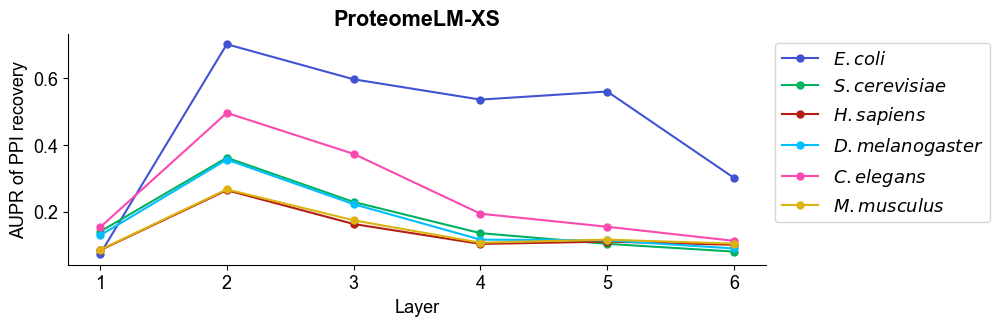

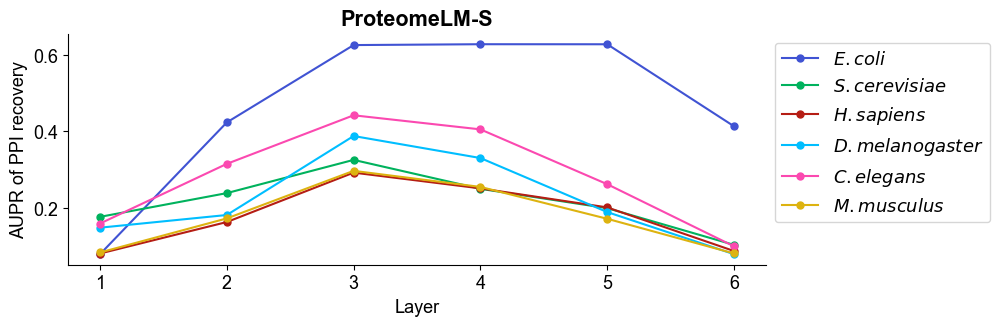

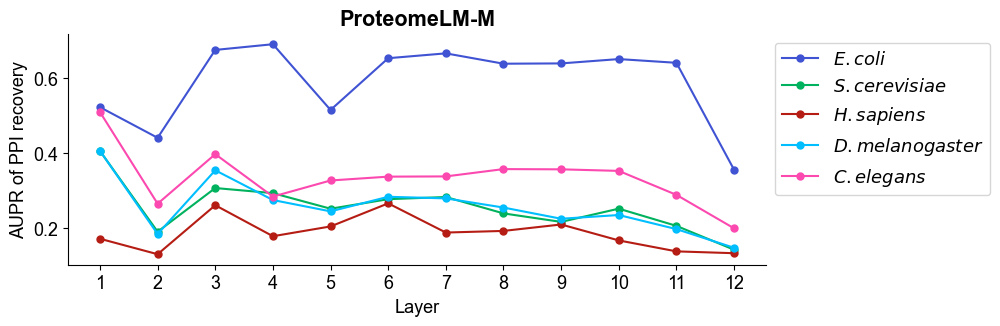

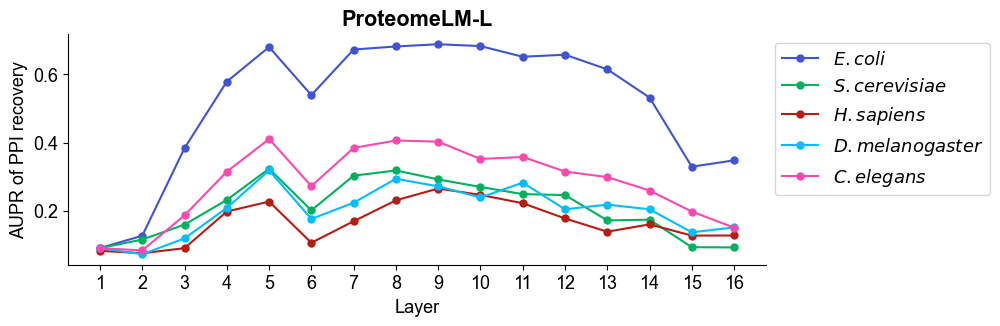

In [31]:
metric = "AUPR"
size_names_to_keep = ["ProteomeLM-XXS", "ProteomeLM-Mini", "ProteomeLM-S", "ProteomeLM-M"]
nice_size_names_to_keep = ["ProteomeLM-XS", "ProteomeLM-S", "ProteomeLM-M", "ProteomeLM-L"]
for i, (model, nice_model) in enumerate(zip(size_names_to_keep, nice_size_names_to_keep)):
    plt.figure(figsize=(9, 3))
    n_layers, _ = model_architectures[model]
    x = np.arange(0, n_layers)
    for spec, nice_spec in zip(species_names, clean_species_names):
        try:
            row = screening_df_dscript_dict[spec].loc[model, 210]
            y = [row[f"{metric}, Layer {i}"] for i in range(n_layers)]
        except:
            continue

        plt.plot(x, y, label=f"$\\it{{{nice_spec}}}$", color=colors_pals[spec], marker="o", markersize=5)
    #plt.ylim(0.4, 1)
    plt.xticks(np.arange(0, n_layers), [f"{i+1}" for i in range(n_layers)])
    plt.xlabel("Layer")
    plt.ylabel(f"{metric} of PPI recovery")
    plt.title(nice_model, fontweight='bold')
    plt.legend(loc = "upper left", bbox_to_anchor=(1, 1))
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.savefig(f"/home/malbrank/Documents/ProteomeLM/img/per_layer_auc_unsupervised_{model}.svg", bbox_inches='tight', dpi=300)
    plt.show()

In [32]:
1

1

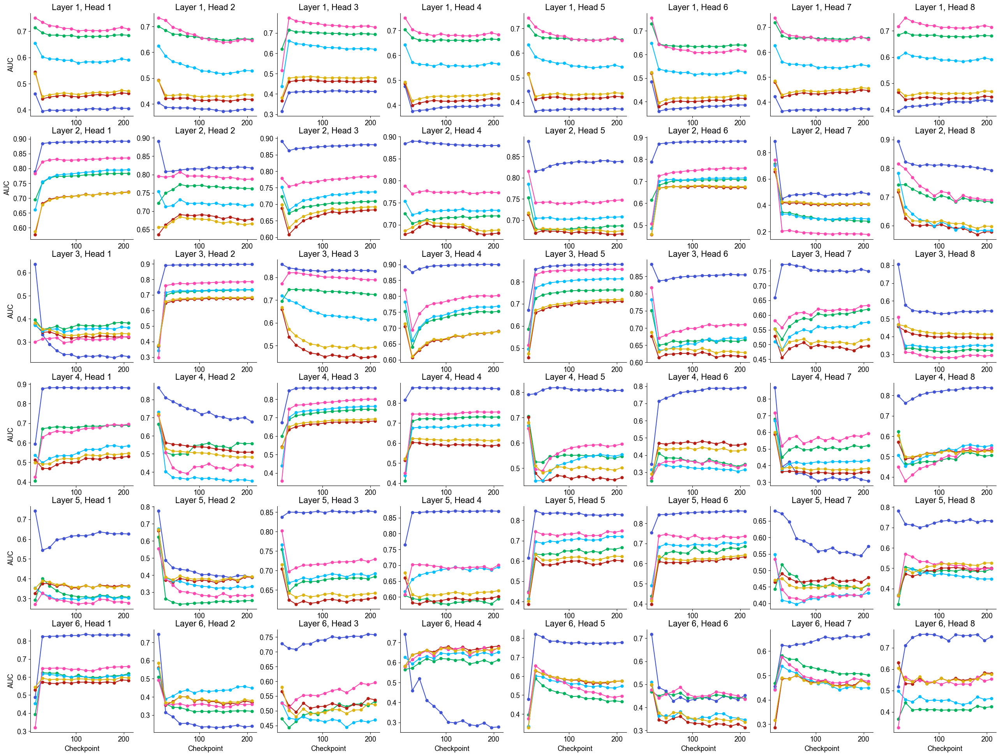

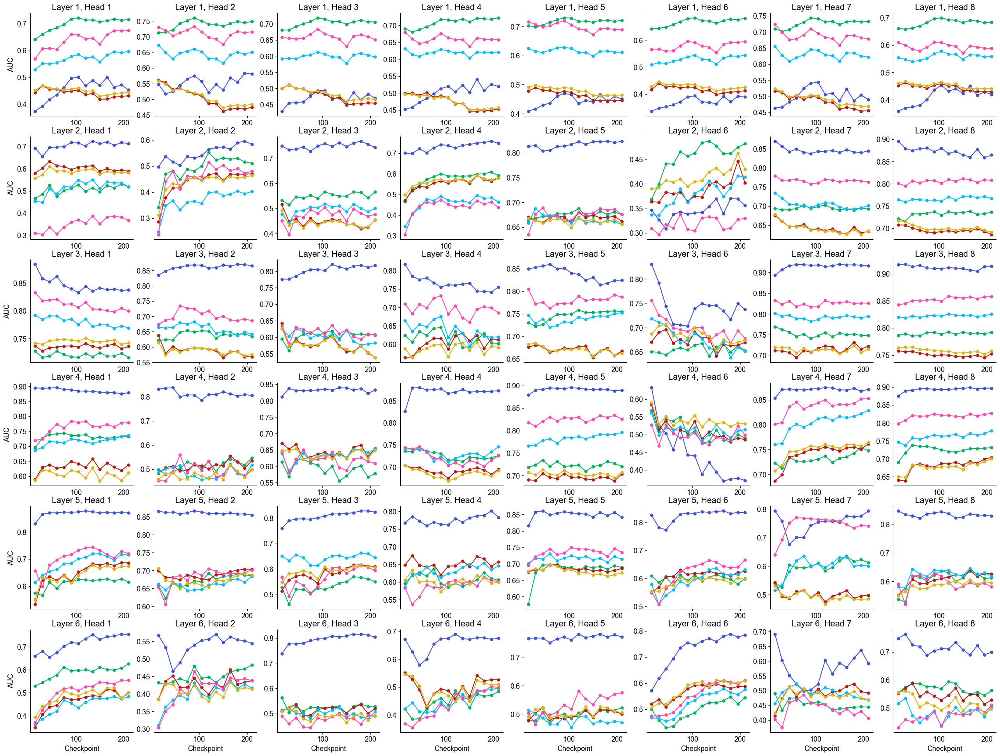

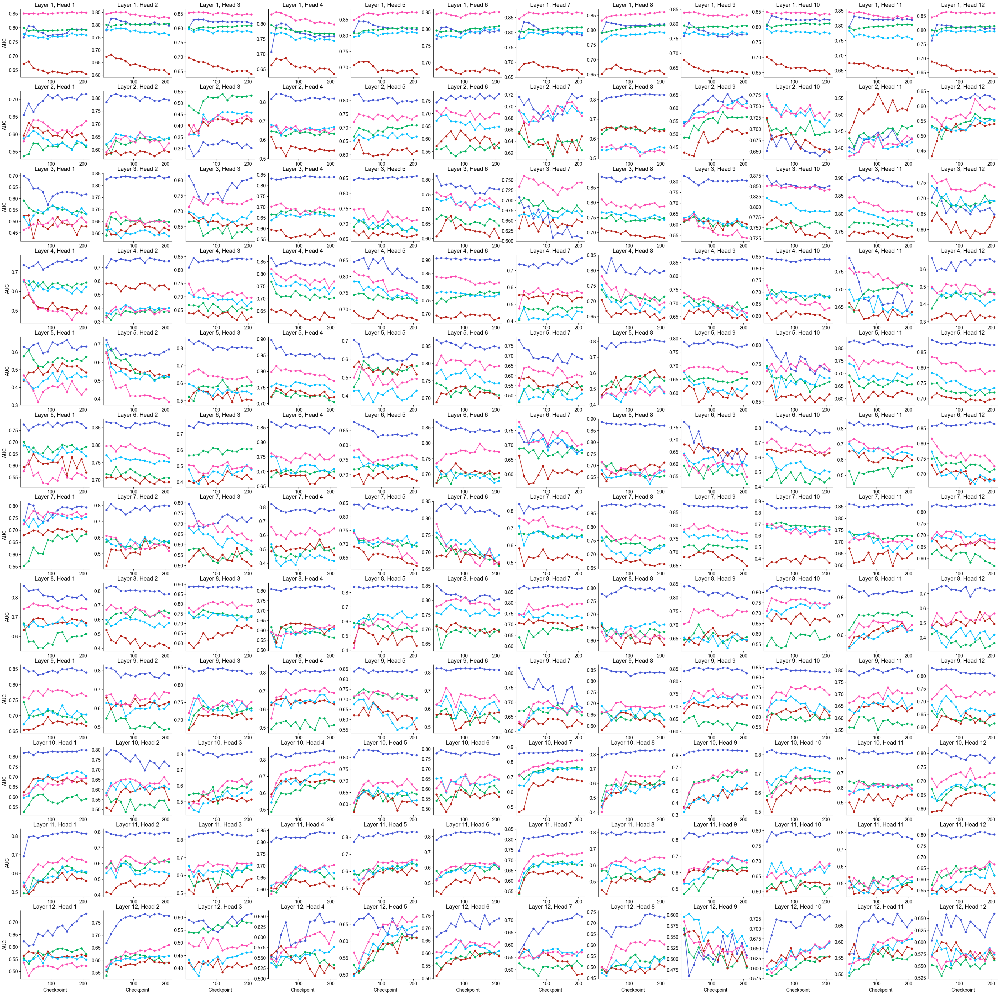

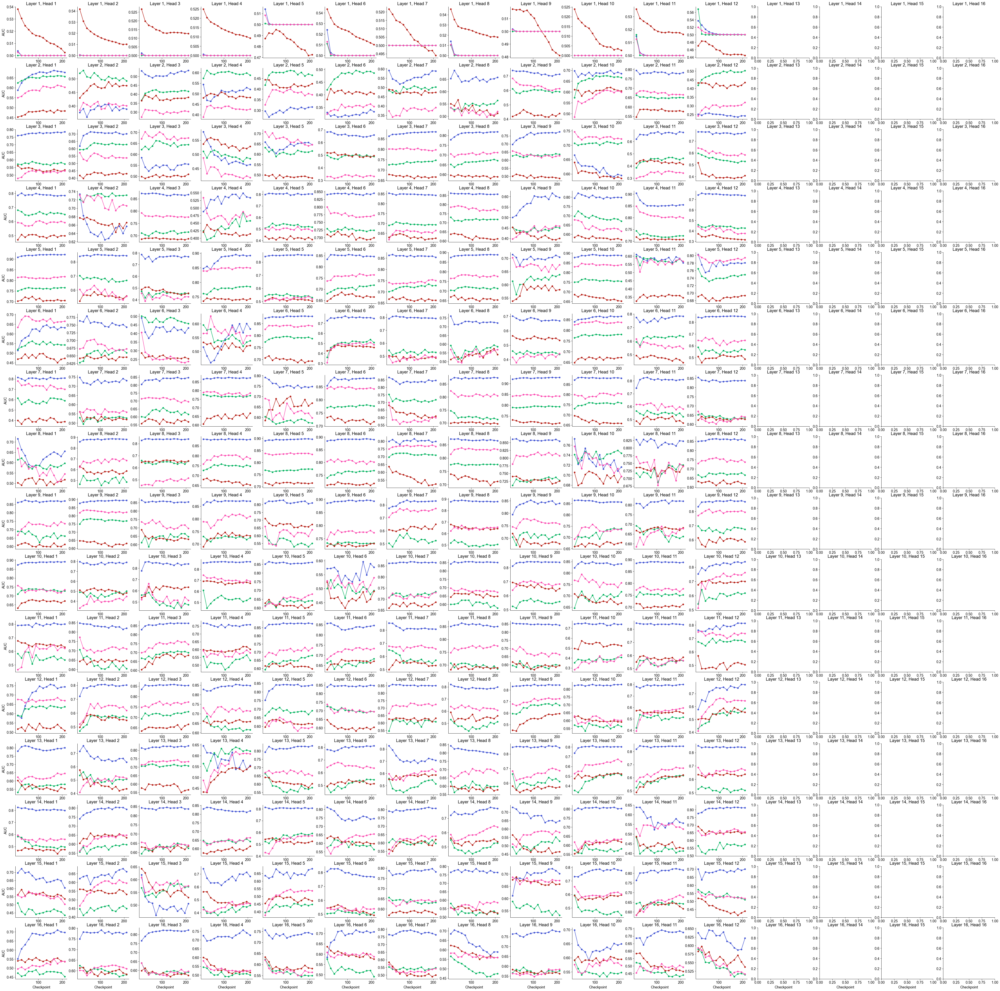

In [40]:
from itertools import product
metric = "AUC"
size_names_to_keep = ["ProteomeLM-XXS", "ProteomeLM-Mini", "ProteomeLM-S", "ProteomeLM-M"]
nice_size_names_to_keep = ["ProteomeLM-XS", "ProteomeLM-S", "ProteomeLM-M", "ProteomeLM-L"]
x = [15,30,45,60,75,90,105,120,135,150,165,180,195,210]

for i, (model, nice_model) in enumerate(zip(size_names_to_keep, nice_size_names_to_keep)):
    n_layers, n_heads = model_architectures[model]
    plt.figure(figsize=(4*n_heads, 4*n_layers))
    for k, (i, j) in enumerate(product(range(n_layers), range(n_heads))):
        plt.subplot(n_layers, n_heads, k+1)
        for spec, nice_spec in zip(species_names, clean_species_names):
            try:
                y = [screening_df_dscript_dict[spec].loc[model, checkpoint][f"{metric}, Layer {i}, Head {j}"] for checkpoint in [15,30,45,60,75,90,105,120,135,150,165,180,195,210]]
            except:
                continue
            plt.plot(x, y, label=f"$\\it{{{nice_spec}}}$", color=colors_pals[spec], marker="o", markersize=5)
        # subplot title
        plt.title(f"Layer {i+1}, Head {j+1}",)
        if i == n_layers-1:
            plt.xlabel("Checkpoint")
        if j==0:
            plt.ylabel(metric)
        plt.gca().spines['top'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)
    plt.savefig(f"/home/malbrank/Documents/ProteomeLM/img/per_head_auc_unsupervised_{model}.svg", bbox_inches='tight', dpi=300)
    plt.show()

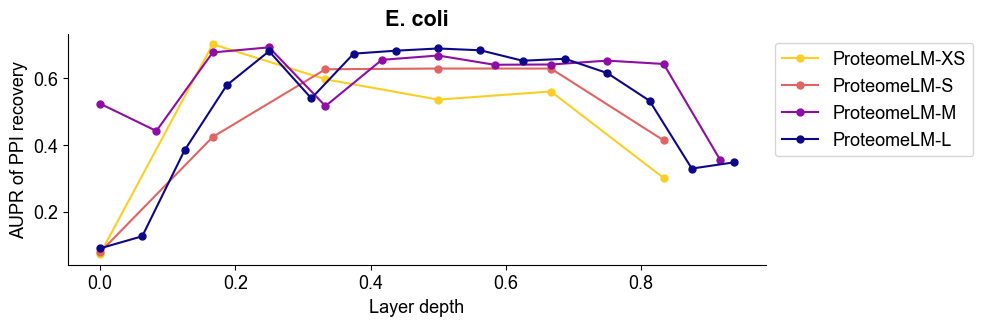

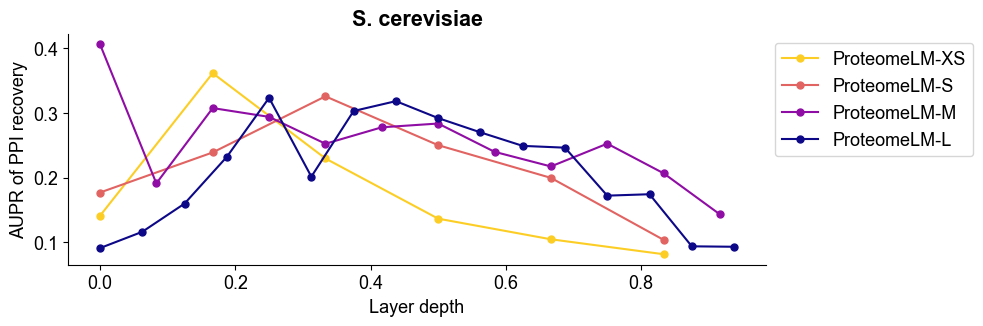

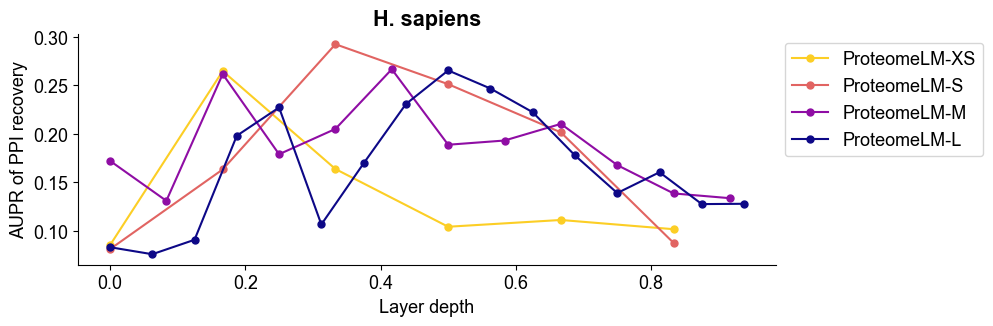

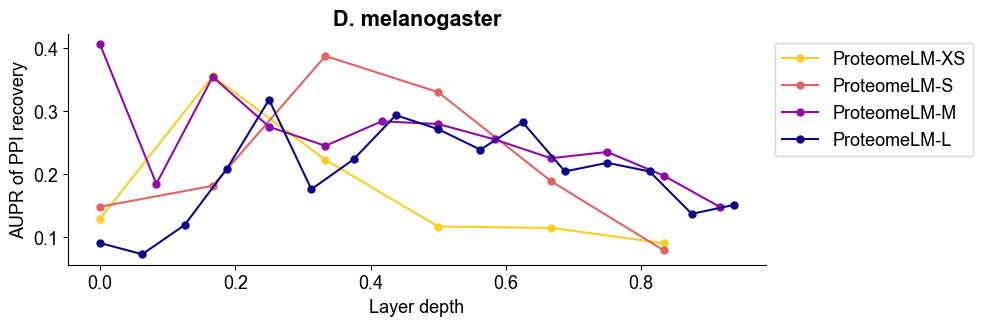

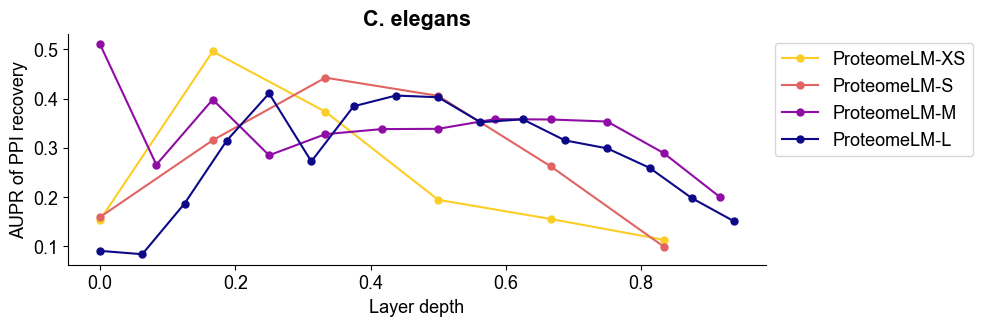

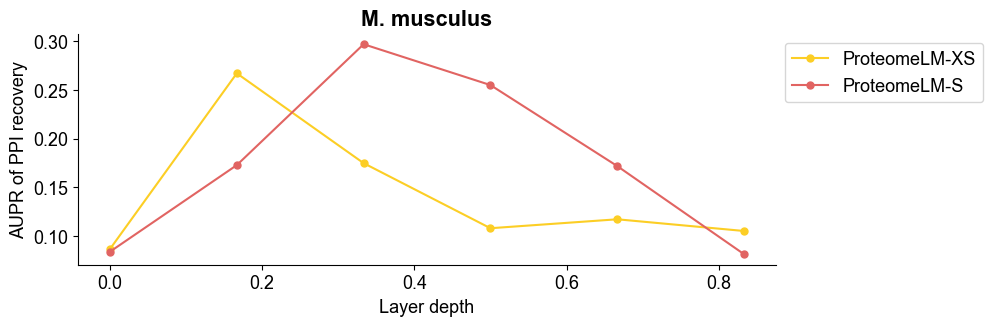

In [42]:
metric = "AUPR"
size_names_to_keep = ["ProteomeLM-XXS", "ProteomeLM-Mini", "ProteomeLM-S", "ProteomeLM-M"]
nice_size_names_to_keep = ["ProteomeLM-XS", "ProteomeLM-S", "ProteomeLM-M", "ProteomeLM-L"]
cmap = plt.get_cmap('plasma')
subrange = np.linspace(0, 0.9, 4)
colors_sizes = [cmap(val) for val in subrange][::-1]
for k, (spec, nice_spec) in enumerate(zip(species_names, clean_species_names)):
    plt.figure(figsize=(9, 3))
    for i, (model, nice_model) in enumerate(zip(size_names_to_keep, nice_size_names_to_keep)):
        n_layers, _ = model_architectures[model]
        try:
            row = screening_df_dscript_dict[spec].loc[model, 210]
            y = [row[f"{metric}, Layer {i}"] for i in range(n_layers)]
        except:
            continue
        x = np.arange(0, n_layers)/n_layers
        plt.plot(x, y, label=nice_model, c=colors_sizes[i], marker="o", markersize=5)
    #plt.xticks(np.arange(0, n_layers), [f"{i+1}" for i in range(n_layers)])
    plt.xlabel("Layer depth")
    plt.ylabel(f"{metric} of PPI recovery")
    plt.title(nice_spec, fontweight='bold')
    plt.legend(loc = "upper left", bbox_to_anchor=(1, 1))
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.savefig(f"/home/malbrank/Documents/ProteomeLM/img/per_layer_auc_unsupervised_{spec}.svg", bbox_inches='tight', dpi=300)
    plt.show()

## Figure 2

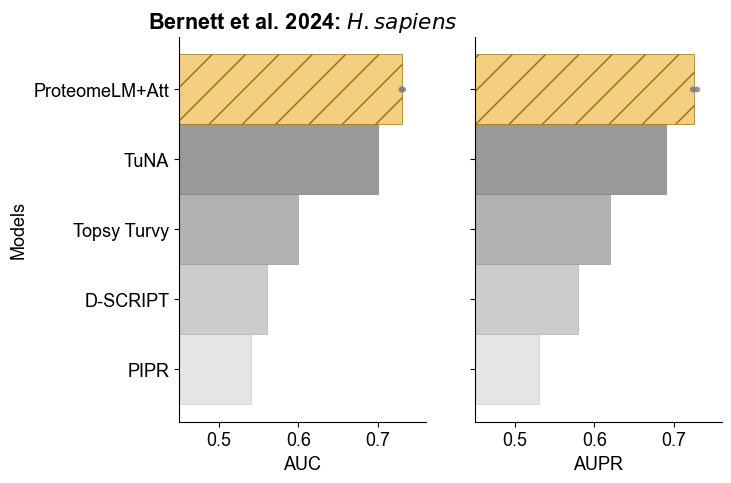

In [ ]:
model = "ProteomeLM-S"
palette = to_palette(colors_pals_goldstandard, len(ppi_models)+1)
palette_baselines = to_palette(colors_pals_baselines, len(baselines_goldstandard)+1)
plt.figure(figsize=(7, 5))

for k, metric in enumerate(["AUC", "AUPR"]):
    dots_x = []
    dots_y = []
    plt.subplot(1, 2, k+1)
    cursor = 1
    y = []
    x = []

    for baseline in baselines_goldstandard.keys():
        y.append(baselines_goldstandard[baseline][metric])
        x.append(cursor)
        cursor += 1
        
    for i, (x_, y_) in enumerate(zip(x, y)):
        plt.barh(x_, y_, height=1, color=palette_baselines[i], edgecolor=palette_baselines[i+1], linewidth=0.5, label=list(baselines_goldstandard.keys())[i])

    x = []
    y = []
    err = []
    for i, ppi_model in enumerate(ppi_models):
        y.append(np.mean([screening_df_goldstandard.loc[model][f"{metric}, Supervised, {ppi_model}_{j}"] for j in range(5)]))
        x.append(cursor)
        for j in range(5):
            dots_y.append(cursor)
            dots_x.append(screening_df_goldstandard.loc[model][f"{metric}, Supervised, {ppi_model}_{j}"])
        cursor += 1

    for i, (x_, y_) in enumerate(zip(x, y)):
        plt.barh(x_, y_, height=1, color=palette[i], edgecolor=palette[i+1], linewidth=0.5, hatch=patterns[i])
    plt.scatter(dots_x, dots_y, color="gray", alpha=0.5, s=10)
    plt.xlabel(metric)
    plt.xticks(np.arange(0.5, 0.8, 0.1))
    if k == 0:
        plt.ylabel("Models")
    if k ==0:
        plt.yticks(np.arange(len(baselines_goldstandard)+len(ppi_models))+1, list(baselines_goldstandard.keys()) + ppi_models)
    else:
        plt.yticks(np.arange(len(baselines_goldstandard)+len(ppi_models))+1, [])
    plt.xlim(0.45, 0.76)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    if k == 0:
        plt.title(f"Bernett et al. 2024: $\\mathbf{{\\it{{H. sapiens}}}}$", fontweight='bold')
    # vertical grid lines
    #plt.grid(axis='x', color='gray', linestyle='--', linewidth=0.2)
plt.savefig("/home/malbrank/Documents/ProteomeLM/img/goldstandard_supervised.svg", dpi=300, bbox_inches='tight')
plt.show()

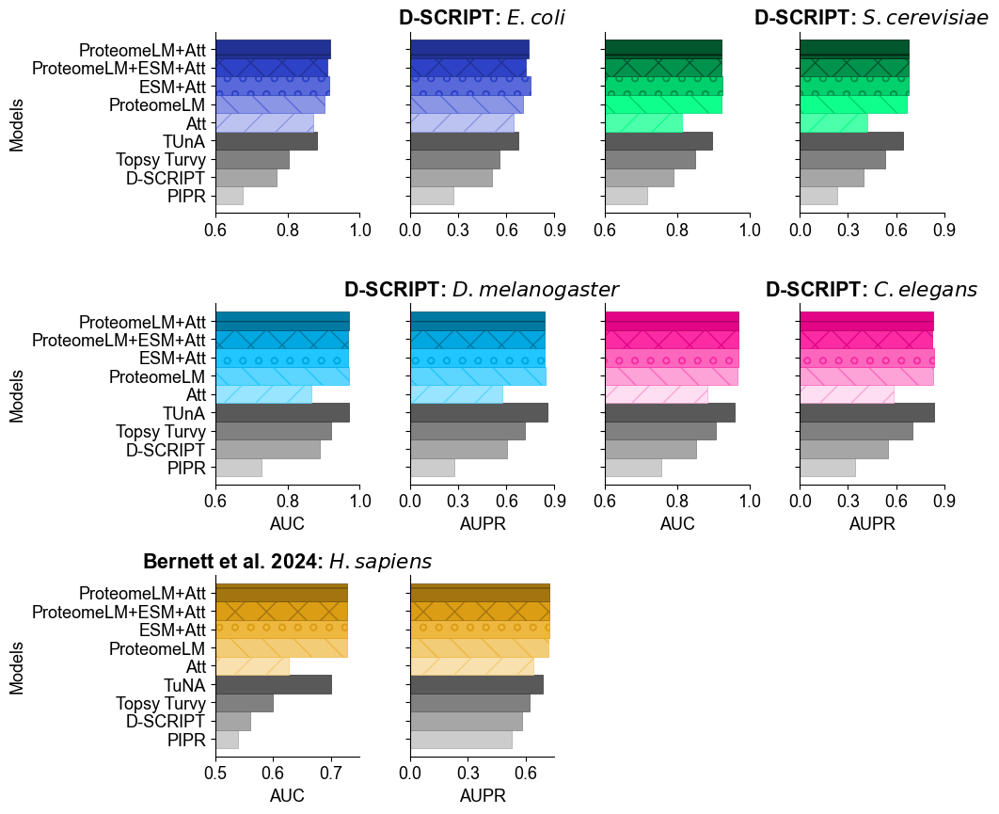

In [15]:
display_species= ["ecoli", "yeast", "fly", "worm", ]
clean_display_species_names = ["E. coli", "S. cerevisiae", "D. melanogaster", "C. elegans"]
ppi_models = ["ProteomeLM+Att", "ProteomeLM+ESM+Att", "ESM+Att", "ProteomeLM", "Att"][::-1]
#ppi_models = ["ProteomeLM+Att"]
metric = "AUC"
model = "ProteomeLM-M"
plot_table = {}

plt.figure(figsize=(10, 10))
plt.subplots_adjust(hspace=0.5, wspace=0.35)
n_baselines = len(baselines_dscript["ecoli"].keys())
baselines = list(baselines_dscript["ecoli"].keys())
for k, (spec, clean_spec) in enumerate(zip(display_species, clean_display_species_names)):
    plt.subplot(3, 4, 2*k+1)
    x = []
    y = []
    cursor = 1
    palette_baselines = to_palette(colors_pals_baselines, len(baselines_dscript[spec].keys())+1)
    palette = to_palette(colors_pals[spec], len(ppi_models)+1)

    for baseline in baselines:
        y.append(baselines_dscript[spec][baseline][metric])
        x.append(cursor)
        cursor += 1
    for i, (x_, y_) in enumerate(zip(x, y)):
        # draw a rectangle using rectangle object matplotlib
        plt.barh(x_, y_, height=1, color=palette_baselines[i],
                edgecolor=palette_baselines[i+1], linewidth=0.5)
    x = []
    y = []
    for ppi_model in ppi_models:
        column = f"AUC, Supervised, {spec}_{ppi_model}_Median"
        y.append(screening_df_dscript.loc[model][column])
        x.append(cursor)
        cursor += 1
    plot_table[spec] = (x, y)
    cursor += 1
    for i, (x_, y_) in enumerate(zip(x, y)):
        # draw a rectangle using rectangle object matplotlib
        plt.barh(x_, y_, height=1, color=palette[i], hatch=patterns[i], edgecolor=palette[i+1], linewidth=0.5)
    if k >= 2:
        plt.xlabel("AUC")
    if k%2 == 0:
        plt.ylabel(f"Models")
    if k%2 == 0:
        plt.yticks(np.arange(n_baselines+len(ppi_models))+1, baselines+ppi_models) #+["ProteomeLM-PPI"]) #+ppi_models)
    else:
        plt.yticks(np.arange(n_baselines+len(ppi_models))+1, [])
    plt.xlim(0.6, 1)
    # remove the top and right spines
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.subplot(3, 4, 2*k+2)
    x = []
    y = []
    cursor = 1
    palette_baselines = to_palette(colors_pals_baselines, len(baselines_dscript[spec].keys())+1)
    palette = to_palette(colors_pals[spec], len(ppi_models)+1)

    for baseline in baselines:
        y.append(baselines_dscript[spec][baseline]["AUPR"])
        x.append(cursor)
        cursor += 1
    for i, (x_, y_) in enumerate(zip(x, y)):
        # draw a rectangle using rectangle object matplotlib
        plt.barh(x_, y_, height=1, color=palette_baselines[i],
                edgecolor=palette_baselines[i+1], linewidth=0.5)
    x = []
    y = []
    for ppi_model in ppi_models:
        column = f"AUPR, Supervised, {spec}_{ppi_model}_Median"
        y.append(screening_df_dscript.loc[model][column])
        x.append(cursor)
        cursor += 1
    plot_table[spec] = (x, y)
    cursor += 1
    for i, (x_, y_) in enumerate(zip(x, y)):
        # draw a rectangle using rectangle object matplotlib
        plt.barh(x_, y_, height=1, color=palette[i], hatch=patterns[i], edgecolor=palette[i+1], linewidth=0.5)
    if k >= 2:
        plt.xlabel("AUPR")
    plt.xticks(np.arange(0.0, 0.95, 0.3))

    plt.yticks(np.arange(n_baselines+len(ppi_models))+1, [])
    plt.xlim(0, .9)
    # remove the top and right spines
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

    plt.title(f"D-SCRIPT: $\\mathbf{{\\it{{{clean_spec}}}}}$", fontweight='bold')
    
model = "ProteomeLM-M"
metric = "AUC"
palette = to_palette(colors_pals_goldstandard, len(ppi_models)+1)
palette_baselines = to_palette(colors_pals_baselines, len(baselines_goldstandard)+1)
#plt.figure(figsize=(7, 5))
error_kw = {'ecolor': 'black', 'capsize': 2, 'elinewidth': 1}
for k, metric in enumerate(["AUC", "AUPR"]):
    plt.subplot(3, 4, 8+k+1)
    cursor = 1
    y = []
    x = []
    err = []

    for baseline in baselines_goldstandard.keys():
        y.append(baselines_goldstandard[baseline][metric])
        err.append(np.std([baselines_goldstandard[baseline][metric] for _ in range(5)]))
        x.append(cursor)
        cursor += 1
        
    for i, (x_, y_, e_) in enumerate(zip(x, y, err)):
        plt.barh(x_, y_, height=1, color=palette_baselines[i], edgecolor=palette_baselines[i+1], linewidth=0.5, label=list(baselines_goldstandard.keys())[i], error_kw=error_kw)

    x = []
    y = []
    err = []
    for i, ppi_model in enumerate(ppi_models):
        y.append(np.mean([screening_df_goldstandard.loc[model][f"{metric}, Supervised, {ppi_model}_{j}"] for j in range(5)]))
        err.append(np.std([screening_df_goldstandard.loc[model][f"{metric}, Supervised, {ppi_model}_{j}"] for j in range(5)]))
        x.append(cursor)
        cursor += 1

    for i, (x_, y_, e_) in enumerate(zip(x, y, err)):
        plt.barh(x_, y_,  height=1, color=palette[i], edgecolor=palette[i+1], linewidth=0.5, hatch=patterns[i], error_kw=error_kw)
    plt.xlabel(metric)
    plt.xlim(0, .75)
    plt.xticks(np.arange(0.0, 0.75, 0.3))
    if k == 0:
        plt.xlim(0.5, .75)
        plt.xticks(np.arange(0.5, 0.75, 0.1))
        plt.ylabel("Models")
        plt.yticks(np.arange(len(baselines_goldstandard)+len(ppi_models))+1, list(baselines_goldstandard.keys()) + ppi_models) # + ["ProteomeLM-PPI"]) #)
    else:
        plt.yticks(np.arange(len(baselines_goldstandard)+len(ppi_models))+1, [])
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    if k == 0:
        plt.title(f"Bernett et al. 2024: $\\mathbf{{\\it{{H. sapiens}}}}$", fontweight='bold')
plt.savefig("/home/malbrank/Documents/ProteomeLM/img/supervised_auc_across_models_dscript_model_m.svg", bbox_inches='tight', dpi=300)

plt.show()


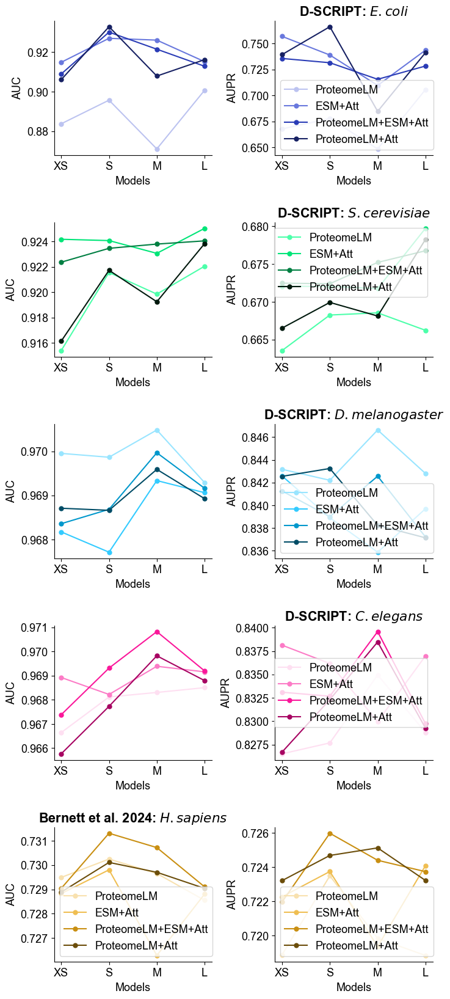

In [34]:
display_species= ["ecoli", "yeast", "fly", "worm", ]
clean_display_species_names = ["E. coli", "S. cerevisiae", "D. melanogaster", "C. elegans"]
ppi_models = ["ProteomeLM+Att", "ProteomeLM+ESM+Att", "ESM+Att", "ProteomeLM",][::-1]
#ppi_models = ["ProteomeLM+Att"]
metric = "AUC"
models = ["ProteomeLM-XXS", "ProteomeLM-Mini", "ProteomeLM-S", "ProteomeLM-M"]
plot_table = {}

plt.figure(figsize=(8, 20))
plt.subplots_adjust(hspace=0.5, wspace=0.4)
n_baselines = len(baselines_dscript["ecoli"].keys())
baselines = list(baselines_dscript["ecoli"].keys())
for k, (spec, clean_spec) in enumerate(zip(display_species, clean_display_species_names)):
    plt.subplot(5, 2, 2*k+1)
    x = []
    y = []
    cursor = 1
    palette_baselines = to_palette(colors_pals_baselines, len(baselines_dscript[spec].keys())+1)
    palette = to_palette(colors_pals[spec], len(ppi_models))

    for baseline in baselines:
        y.append(baselines_dscript[spec][baseline][metric])
        x.append(cursor)
        cursor += 1
    for ppi_model in ppi_models:
        x = np.arange(4)
        y = []
        for model_size in models:
            column = f"AUC, Supervised, {spec}_{ppi_model}_Mean"
            y.append(screening_df_dscript.loc[model_size][column])
        plt.plot(x, y, label=ppi_model, color=palette[ppi_models.index(ppi_model)], marker="o", markersize=5)
    plt.ylabel("AUC")
    plt.xlabel(f"Models")
    # remove the top and right spines
    plt.xticks(x, clean_size_names_short)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.subplot(5, 2, 2*k+2)
    x = []
    y = []

    for baseline in baselines:
        y.append(baselines_dscript[spec][baseline][metric])
        x.append(cursor)
        cursor += 1
    for ppi_model in ppi_models:
        x = np.arange(4)
        y = []
        for model_size in models:
            column = f"AUPR, Supervised, {spec}_{ppi_model}_Mean"
            y.append(screening_df_dscript.loc[model_size][column])
        plt.plot(x, y, label=ppi_model, color=palette[ppi_models.index(ppi_model)], marker="o", markersize=5)
    plt.ylabel("AUPR")
    plt.xlabel(f"Models")
    plt.xticks(x, clean_size_names_short)

    # remove the top and right spines
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend()

    plt.title(f"D-SCRIPT: $\\mathbf{{\\it{{{clean_spec}}}}}$", fontweight='bold')
    
palette = to_palette(colors_pals_goldstandard, len(ppi_models))
palette_baselines = to_palette(colors_pals_baselines, len(baselines_goldstandard)+1)
#plt.figure(figsize=(7, 5))
error_kw = {'ecolor': 'black', 'capsize': 2, 'elinewidth': 1}
for k, metric in enumerate(["AUC", "AUPR"]):
    plt.subplot(5, 2, 8+k+1)
    cursor = 1

    for baseline in baselines_goldstandard.keys():
        continue
        #plt.plot([0, 3], [baselines_goldstandard[baseline][metric], baselines_goldstandard[baseline][metric]], color=palette_baselines[cursor-1], linewidth=2, label=baseline)
    x = np.arange(4)
    for i, ppi_model in enumerate(ppi_models):
        y = []
        for model in models:
            y.append(np.mean([screening_df_goldstandard.loc[model][f"{metric}, Supervised, {ppi_model}_{j}"] for j in range(5)]))
        plt.plot(x, y, label=ppi_model, color=palette[ppi_models.index(ppi_model)], marker="o", markersize=5)
    plt.ylabel(metric)
    plt.xticks(x, clean_size_names_short)
    plt.xlabel("Models")
    plt.legend()
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    if k == 0:
        plt.title(f"Bernett et al. 2024: $\\mathbf{{\\it{{H. sapiens}}}}$", fontweight='bold')
plt.savefig("/home/malbrank/Documents/ProteomeLM/img/supervised_auc_across_models_dscript_model_m.svg", bbox_inches='tight', dpi=300)
plt.show()

## Figure 3

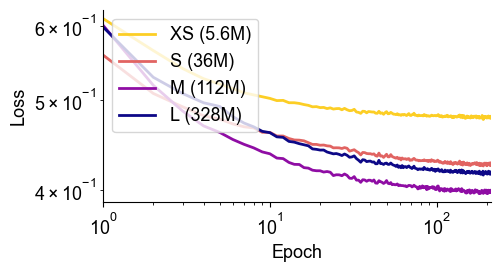

In [ ]:
plt.figure(figsize=(5, 2.5))
# Extract epoch values
epochs = training_df["train/epoch"]
cmap = plt.get_cmap('plasma')
subrange = np.linspace(0, 0.9, 4)
colors_sizes = [cmap(val) for val in subrange][::-1]

models_to_keep = ["ProteomeLM-XXS", "ProteomeLM-Mini", "ProteomeLM-S", "ProteomeLM-M"]
display_names = ["XS (5.6M)", "S (36M)", "M (112M)", "L (328M)"]

# Identify model names by checking column structure
models = set()
for col in training_df.columns:
    if "eval/loss" in col and "__" not in col:
        model = col.split(" - ")[0]
        models.add(model)

# Prepare plots
for i, (model, name) in enumerate(zip(models_to_keep, display_names)):
    eval_col = f"{model}-Kuma - eval/loss"
    plt.plot(epochs, training_df[eval_col], label=f"{name}", linestyle='-', color=colors_sizes[i], linewidth=2)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.xscale("log")
plt.yscale("log")
#plt.title("Evaluation loss along training", fontweight='bold')
plt.legend()
plt.xlim(1, 210)
#plt.tight_layout()
# remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
# save svg
plt.savefig("/home/malbrank/Documents/ProteomeLM/img/training_log.svg", bbox_inches='tight', dpi=300)
plt.show()

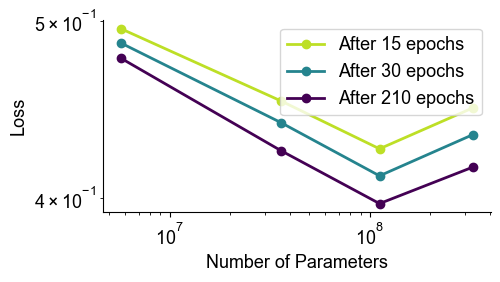

In [ ]:
n_parameters = [5.6, 37, 112, 328]
losses = [[training_df[training_df["train/epoch"] == i][f"{model}-Kuma - eval/loss"].values[0] for i in range(1, 211)] for model in size_names]
epochs = training_df["train/epoch"]
cmap = plt.get_cmap('viridis')
subrange = np.linspace(0, 0.9, 3)
colors_epochs = [cmap(val) for val in subrange][::-1]

plt.figure(figsize=(5, 2.5))
for i,k  in enumerate([15, 30, 210]):
    plt.plot(parameters_size, [losses[j][k-1] for j in range(len(size_names))], marker='o', linestyle='-', color=colors_epochs[i], linewidth=2, label=f"After {k} epochs")
plt.legend()
# plt.title("Scaling law for evaluation loss", fontweight='bold')
plt.xlabel("Number of Parameters")
plt.ylabel("Loss")
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.xscale("log")
plt.yscale("log")
plt.savefig("/home/malbrank/Documents/ProteomeLM/img/scaling_law.svg", bbox_inches='tight', dpi=300)
plt.show()

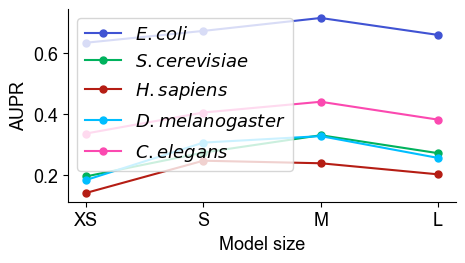

In [ ]:
metric = "AUPR"
plt.figure(figsize=(5, 2.5))
# vspace
plt.subplots_adjust(hspace=0.5)
for spec, nice_spec in zip(species_names, clean_species_names):
    if spec == "mouse":
        continue
    df = screening_df_dscript_dict[spec]
    n_layers = 6 
    x = np.arange(0, len(size_names))
    y = [df.loc[size, 210][f"{metric}, Sum"][0] for size in size_names]
    plt.plot(x, y, label=f"$\\mathbf{{\\it{{{nice_spec}}}}}$", color=colors_pals[spec], marker="o", markersize=5)

    plt.xticks(x, clean_size_names_short)
plt.xlabel("Model size")
plt.ylabel(metric)
# plt.title(f"AUC of PPI recovery from sum of attention across model size", fontweight='bold')
plt.legend()
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.savefig(f"/home/malbrank/Documents/ProteomeLM/img/unsupervised_{metric}_across_models.svg", bbox_inches='tight', dpi=300)
plt.show()

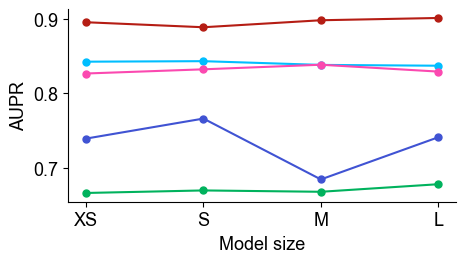

In [ ]:
metric = "AUPR"
size_names = ["ProteomeLM-XXS", "ProteomeLM-Mini", "ProteomeLM-S", "ProteomeLM-M"]
plt.figure(figsize=(5, 2.5))
# vspace
for i, (spec, nice_spec) in enumerate(zip(species_names, clean_species_names)):
    if spec == "mouse":
        continue
    #plt.subplot(5, 1 ,i+1)
    dots_x = []
    dotx_y = []
    y = []
    x = np.arange(0, len(size_names[:4]))
    for k, size in enumerate(size_names):
        y.append(screening_df_dscript.loc[size][f"{metric}, Supervised, {spec}_ProteomeLM+Att_Mean"])
        for i in range(5):
            dots_x.append(k)
            dotx_y.append(screening_df_dscript.loc[size][f"{metric}, Supervised, {spec}_ProteomeLM+Att_{i}"])
    #plt.scatter(dots_x, dotx_y, color="gray", alpha=0.5, s=10)
    plt.plot(x, y, label=f"$\\mathbf{{\\it{{{nice_spec}}}}}$", color=colors_pals[spec], marker="o", markersize=5)
    plt.xticks(x, "    ")
    if i == 4:
        plt.xticks(x, clean_size_names_short[:4])
        plt.xlabel("Model size")
    plt.ylabel(metric)
    # plt.title(f"AUC of PPI recovery from sum of attention across model size", fontweight='bold')
    #plt.legend()
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.savefig(f"/home/malbrank/Documents/ProteomeLM/img/supervised_{metric}_across_models.svg", bbox_inches='tight', dpi=300)
plt.show()

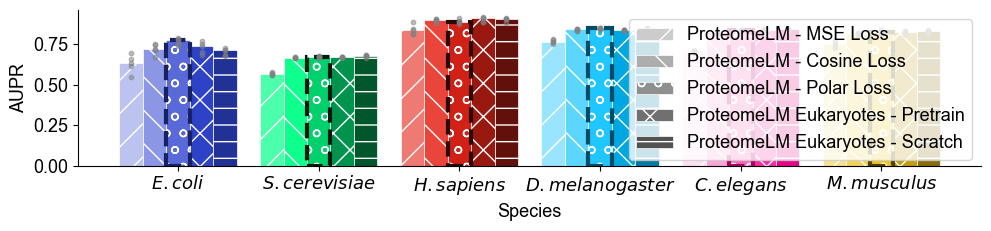

In [36]:
from matplotlib.patches import Patch, Rectangle

cursor = 1
metric = "AUPR"
plot_table = {}

for i, (spec, clean_spec) in enumerate(zip(species_names, clean_species_names)):
    x = []
    y = []
    dots_x = []
    dotx_y = []
    for k, model_name in enumerate(model_names):
        column = f"{metric}, Supervised, {spec}_ProteomeLM+Att_Median"
        value = screening_df_dscript.loc[model_name][column]  # Consider try-except here if data is incomplete
        try:
            y.append(value[0])
        except:
            y.append(value)
        x.append(cursor)
        for i in range(5):
            dots_x.append(cursor)
            dotx_y.append(screening_df_dscript.loc[model_name][f"{metric}, Supervised, {spec}_ProteomeLM+Att_{i}"])
        cursor += 1
    plot_table[spec] = (x, y, dots_x, dotx_y)
    cursor += 1  # Extra space between species

plt.figure(figsize=(10, 2.5))

for spec, (x, y, dots_x, dotx_y) in plot_table.items():
    palette = to_palette(colors_pals[spec], n_colors=len(model_names)+1)
    for i, (x_, y_) in enumerate(zip(x, y)):
        bar_color = palette[i]
        bar_hatch = patterns[i]
        bar_edgecolor = "white"
        bar_linewidth = 0.5
        
        # Plot the bars normally
        plt.bar(
            x_, y_, width=1,
            label=clean_model_names[i] if spec == "ecoli" else None,
            color=bar_color,
            hatch=bar_hatch,
            edgecolor=bar_edgecolor,
            linewidth=bar_linewidth
        )
        
        # Highlight the third bar (index 2) with a rectangle around it
    rect = Rectangle((x[2] - 0.5, 0), 1, y[2], linewidth=3, edgecolor=palette[-1], facecolor='none', linestyle='--')
    plt.gca().add_patch(rect)
    
    plt.scatter(dots_x, dotx_y, color="gray", alpha=0.5, s=10, label="replicates")

plt.xlabel("Species")
plt.ylabel(f"{metric}")
plt.xticks(
    [v[0][2] for v in plot_table.values()],
    [f"$\\mathbf{{\\it{{{clean_species_names[species_names.index(s)]}}}}}$" for s in plot_table.keys()],
)

# Create custom gray legend
palette = to_palette(colors_pals_baselines, n_colors=len(model_names)+1)

gray_legend_handles = [
    Patch(facecolor=palette[i], hatch=patterns[i], label=clean_model_names[i], edgecolor="white", linewidth=0.5)
    for i in range(len(model_names))
]

plt.legend(handles=gray_legend_handles)
#plt.ylim(0.7, 1)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.title("AUPR of PPI recovery (supervised ProteomeLM+Att) on DSCRIPT", fontweight='bold')
plt.tight_layout()
plt.savefig("/home/malbrank/Documents/ProteomeLM/img/supervised_auc_across_models.svg", bbox_inches='tight', dpi=300)
plt.show()


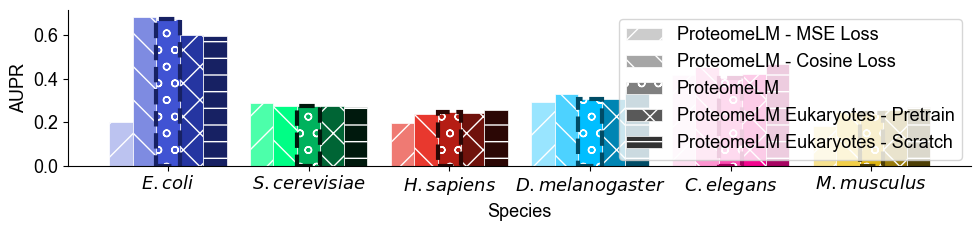

In [ ]:
cursor = 1
metric = "AUPR"
plot_table = {}

for i, (spec, clean_spec) in enumerate(zip(species_names, clean_species_names)):
    x = []
    y = []
    for model_name in model_names:
        value = screening_df_dscript_dict[spec].loc[model_name, 210][f"{metric}, Sum"]  # Consider try-except here if data is incomplete
        y.append(value)
        x.append(cursor)
        cursor += 1
    plot_table[spec] = (x, y)
    cursor += 1  # Extra space between species

plt.figure(figsize=(10, 2.5))

for spec, (x, y) in plot_table.items():
    palette = to_palette(colors_pals[spec], n_colors=len(model_names))
    for i, (x_, y_) in enumerate(zip(x, y)):
        plt.bar(
            x_, y_, width=1,
            label=clean_model_names[i] if spec == "ecoli" else None,
            color=palette[i],
            hatch=patterns[i],
            edgecolor="white",
            linewidth=0.5
        )
    try:
        rect = Rectangle((x[2] - 0.5, 0), 1, y[2], linewidth=3, edgecolor=palette[-1], facecolor='none', linestyle='--')
        plt.gca().add_patch(rect)
    except:
        rect = Rectangle((x[2] - 0.5, 0), 1, y[2][0], linewidth=3, edgecolor=palette[-1], facecolor='none', linestyle='--')
        plt.gca().add_patch(rect)



plt.xlabel("Species")
plt.ylabel(f"{metric}")
plt.xticks(
    [v[0][2] for v in plot_table.values()],
    [f"$\\mathbf{{\\it{{{clean_species_names[species_names.index(s)]}}}}}$" for s in plot_table.keys()],
)

# Create custom gray legend
palette = to_palette(colors_pals_baselines, n_colors=len(model_names))

gray_legend_handles = [
    Patch(facecolor=palette[i], hatch=patterns[i], label=clean_model_names[i], edgecolor="white", linewidth=0.5)
    for i in range(len(model_names))
]

plt.legend(handles=gray_legend_handles)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.title("AUPR of PPI recovery (unsupervised sum of attention) on DSCRIPT", fontweight='bold')
#plt.ylim(0.5, 1)
plt.tight_layout()
plt.savefig("/home/malbrank/Documents/ProteomeLM/img/unsupervised_auc_across_models.svg", bbox_inches='tight', dpi=300)
plt.show()
